In [1]:
import numpy as np
import torch
import matplotlib
import matplotlib.pyplot as plt

import torchvision
from torchvision import transforms

## Grab the test data and visualise

In [2]:
data_path = "/home/sravula/experiments/datasets/8047_vel_imgs.npy"

In [3]:
from datasets.velocity_fine import Velocity

tran_transform = transforms.Compose([
    transforms.Resize([256, 256])
])

dataset = Velocity(path=data_path, transform=tran_transform)

In [4]:
N = len(dataset)
indices = list(range(N))
random_state = np.random.get_state()
np.random.seed(2240)
np.random.shuffle(indices)
np.random.set_state(random_state)
train_indices, test_indices = indices[:int(N * 0.9)], indices[int(N * 0.9):]

In [5]:
test_dataset = torch.utils.data.Subset(dataset, test_indices)

In [6]:
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=15, shuffle=False,
                         num_workers=8, drop_last=True)

test_iter = iter(test_loader)

test_sample = next(test_iter)[0]

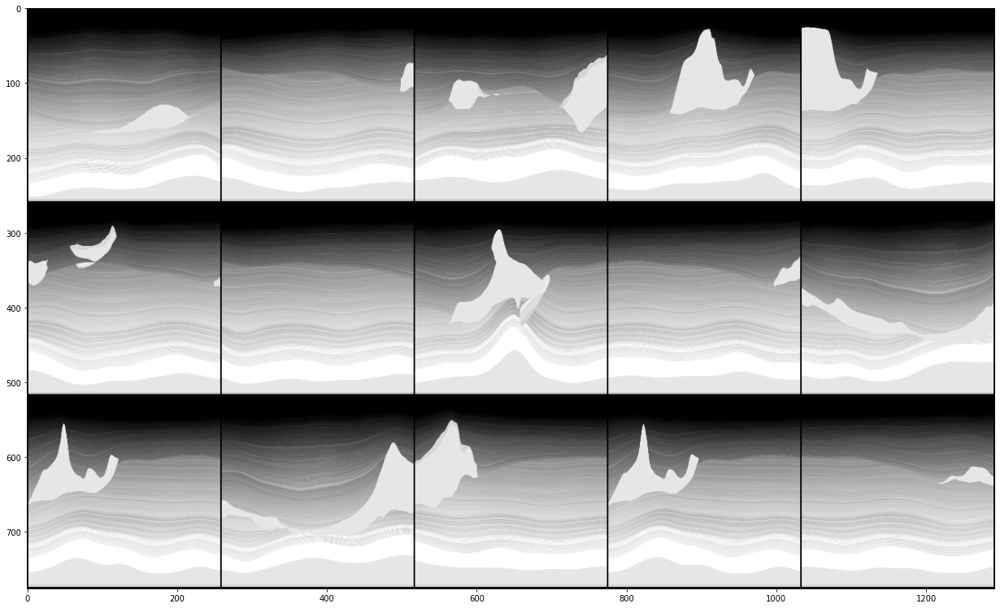

In [7]:
grid_img = torchvision.utils.make_grid(test_sample, nrow=5)

dpi = matplotlib.rcParams['figure.dpi']

height = width = 6*256
figsize = width / float(dpi), height / float(dpi)

plt.figure(figsize=figsize)
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

## Noise the test data and visualise

In [8]:
#We want y = Ax where A is a random Gaussian
#y = [N, m, 1], A = [N, m, C x W x H], x = [N, C, H, W]

N, C, H, W = test_sample.shape

m = 10000

In [9]:
#A = (1 / np.sqrt(m)) * torch.randn(m, C*H*W)
A = torch.eye(C*H*W)[np.random.choice(a=C*H*W, size=m, replace=False).tolist()]

y = torch.matmul(A, test_sample.view(N, -1, 1))

print(A.shape)
print(y.shape)
print(test_sample.shape)

torch.Size([10000, 65536])
torch.Size([15, 10000, 1])
torch.Size([15, 1, 256, 256])


## Load the network and perform Langevin dynamics on the noisy images

In [10]:
ckpt_path = "/home/sravula/experiments/logs/run_2/checkpoint.pth"
config_path = "/home/sravula/ncsnv2/configs/velocity.yml"

In [11]:
import argparse
from main import dict2namespace
import yaml

with open(config_path, 'r') as f:
    config = yaml.load(f)
new_config = dict2namespace(config)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
new_config.device = device

print(device)

/home/sravula/venvs/ncsnv2/lib64/python3.6/site-packages/ipykernel_launcher.py:6: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  


cuda


In [12]:
from models.ncsnv2 import NCSNv2Deepest
from models.ema import EMAHelper
from models import get_sigmas

new_config.input_dim = new_config.data.image_size ** 2 * new_config.data.channels

score = NCSNv2Deepest(new_config).to(new_config.device)
score = torch.nn.DataParallel(score)

#Set up the exponential moving average
if new_config.model.ema:
    ema_helper = EMAHelper(mu=new_config.model.ema_rate)
    ema_helper.register(score)

states = torch.load(ckpt_path)
score.load_state_dict(states[0])
### Make sure we can resume with different eps
states[1]['param_groups'][0]['eps'] = new_config.optim.eps

if new_config.model.ema:
    ema_helper.load_state_dict(states[4])

#grab all L noise levels
sigmas = get_sigmas(new_config)

In [13]:
test_score = ema_helper.ema_copy(score)

test_score.eval()

DataParallel(
  (module): NCSNv2Deepest(
    (act): ELU(alpha=1.0)
    (begin_conv): Conv2d(1, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (normalizer): InstanceNorm2dPlus(
      (instance_norm): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    )
    (end_conv): Conv2d(128, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (res1): ModuleList(
      (0): ResidualBlock(
        (non_linearity): ELU(alpha=1.0)
        (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (normalize2): InstanceNorm2dPlus(
          (instance_norm): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        )
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (normalize1): InstanceNorm2dPlus(
          (instance_norm): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        )
      )
      (1): Resid

In [14]:
from models import langevin_Inverse
import time

N, C, H, W = test_sample.shape
print(N, C, H, W)

y = y.to(new_config.device)

A = A.to(new_config.device)

x0 = torch.rand(N, C, H, W, device=new_config.device)

mse = torch.nn.MSELoss()
mse_start = mse(x0, test_sample.to(new_config.device))
print("Start MSE: ", mse_start.item())

start = time.time()

num_iters = 100

all_samples = langevin_Inverse(x_mod = x0, 
                                       y = y, 
                                       A = A, 
                                       scorenet = test_score, 
                                       sigmas = sigmas.cpu().numpy(), 
                                       n_steps_each=1,
                                       step_lr=new_config.sampling.step_lr,
                                       final_only=False, 
                                       verbose=True,
                                       denoise=False,
                                       add_noise=False, 
                                       decimate_sigma=1100//num_iters,
                                       mode=None,
                                       true_x=test_sample.to(new_config.device))

print("\nTOTAL TIME: ", time.time() - start)

15 1 256 256
Start MSE:  0.21239842474460602


/home/sravula/venvs/ncsnv2/lib64/python3.6/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)



level: 0, step_size: 5.0000, prior_norm: 3.4063, likelihood_norm: 3.4063, grad_norm: 5.4459                             image_norm: 141.1753, train_mse: 0.2120
true_mse: 0.1563

level: 1, step_size: 4.9202, prior_norm: 3.4410, likelihood_norm: 1.8289, grad_norm: 3.8147                             image_norm: 137.4487, train_mse: 0.0611
true_mse: 0.1228

level: 2, step_size: 4.8416, prior_norm: 3.4897, likelihood_norm: 1.2702, grad_norm: 3.3341                             image_norm: 135.3232, train_mse: 0.0295
true_mse: 0.0998

level: 3, step_size: 4.7643, prior_norm: 3.5379, likelihood_norm: 1.2107, grad_norm: 3.1288                             image_norm: 134.7771, train_mse: 0.0268
true_mse: 0.0843

level: 4, step_size: 4.6883, prior_norm: 3.4843, likelihood_norm: 1.3966, grad_norm: 2.6661                             image_norm: 135.6702, train_mse: 0.0357
true_mse: 0.0743

level: 5, step_size: 4.6134, prior_norm: 3.5179, likelihood_norm: 1.7800, grad_norm: 2.5291                  


level: 46, step_size: 2.3848, prior_norm: 4.6428, likelihood_norm: 0.5990, grad_norm: 5.0514                             image_norm: 168.8107, train_mse: 0.0066
true_mse: 0.0046

level: 47, step_size: 2.3467, prior_norm: 4.6782, likelihood_norm: 0.5912, grad_norm: 5.0828                             image_norm: 169.0656, train_mse: 0.0064
true_mse: 0.0045

level: 48, step_size: 2.3092, prior_norm: 4.7200, likelihood_norm: 0.5833, grad_norm: 5.1207                             image_norm: 169.3058, train_mse: 0.0062
true_mse: 0.0044

level: 49, step_size: 2.2723, prior_norm: 4.7559, likelihood_norm: 0.5765, grad_norm: 5.1533                             image_norm: 169.5395, train_mse: 0.0061
true_mse: 0.0042

level: 50, step_size: 2.2361, prior_norm: 4.7987, likelihood_norm: 0.5686, grad_norm: 5.1913                             image_norm: 169.7610, train_mse: 0.0059
true_mse: 0.0041

level: 51, step_size: 2.2004, prior_norm: 4.8351, likelihood_norm: 0.5629, grad_norm: 5.2252            


level: 92, step_size: 1.1374, prior_norm: 6.7842, likelihood_norm: 0.4046, grad_norm: 7.0327                             image_norm: 174.3961, train_mse: 0.0030
true_mse: 0.0025

level: 93, step_size: 1.1193, prior_norm: 6.8375, likelihood_norm: 0.4051, grad_norm: 7.0864                             image_norm: 174.4449, train_mse: 0.0030
true_mse: 0.0025

level: 94, step_size: 1.1014, prior_norm: 6.8964, likelihood_norm: 0.4004, grad_norm: 7.1391                             image_norm: 174.4935, train_mse: 0.0030
true_mse: 0.0025

level: 95, step_size: 1.0838, prior_norm: 6.9508, likelihood_norm: 0.4008, grad_norm: 7.1939                             image_norm: 174.5395, train_mse: 0.0030
true_mse: 0.0025

level: 96, step_size: 1.0665, prior_norm: 7.0103, likelihood_norm: 0.3963, grad_norm: 7.2475                             image_norm: 174.5853, train_mse: 0.0029
true_mse: 0.0025

level: 97, step_size: 1.0495, prior_norm: 7.0658, likelihood_norm: 0.3967, grad_norm: 7.3032            

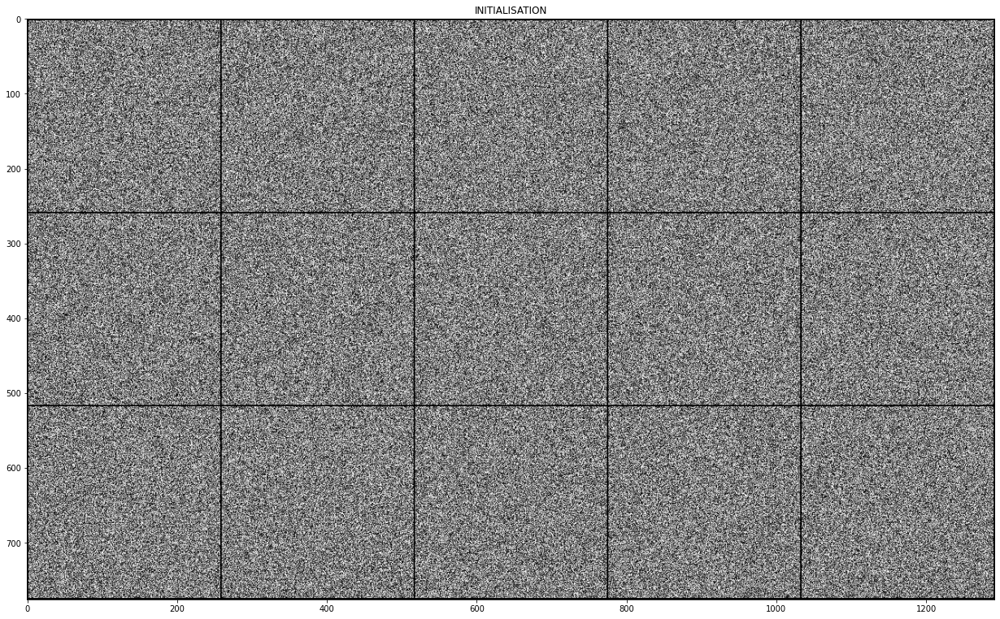

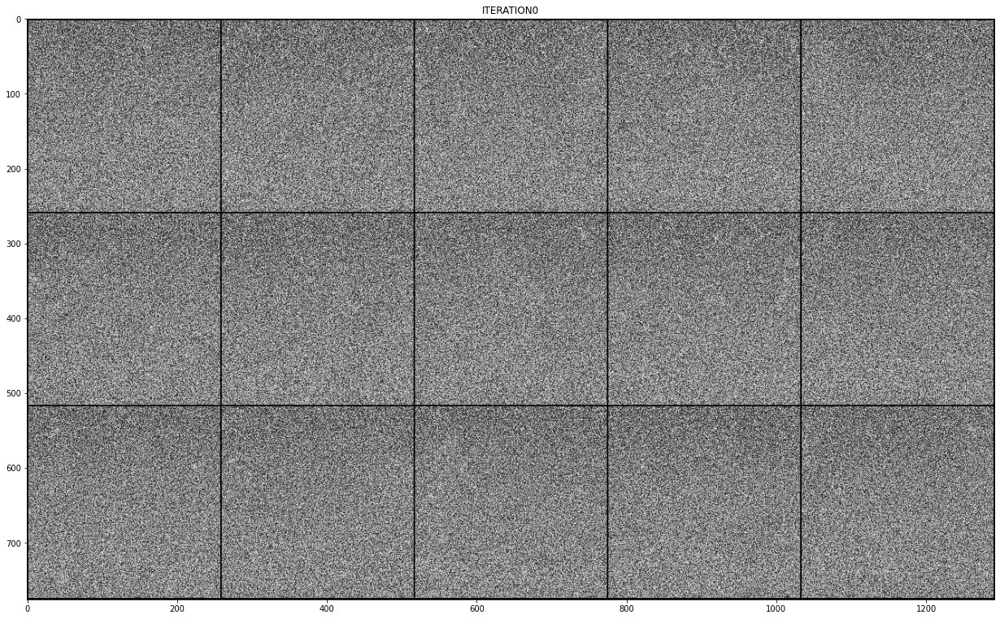

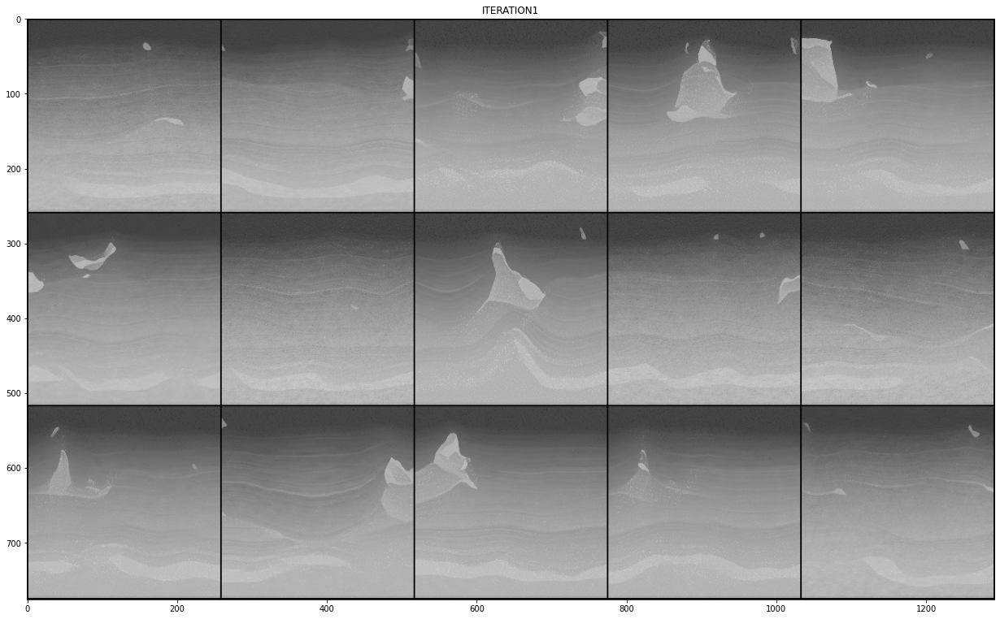

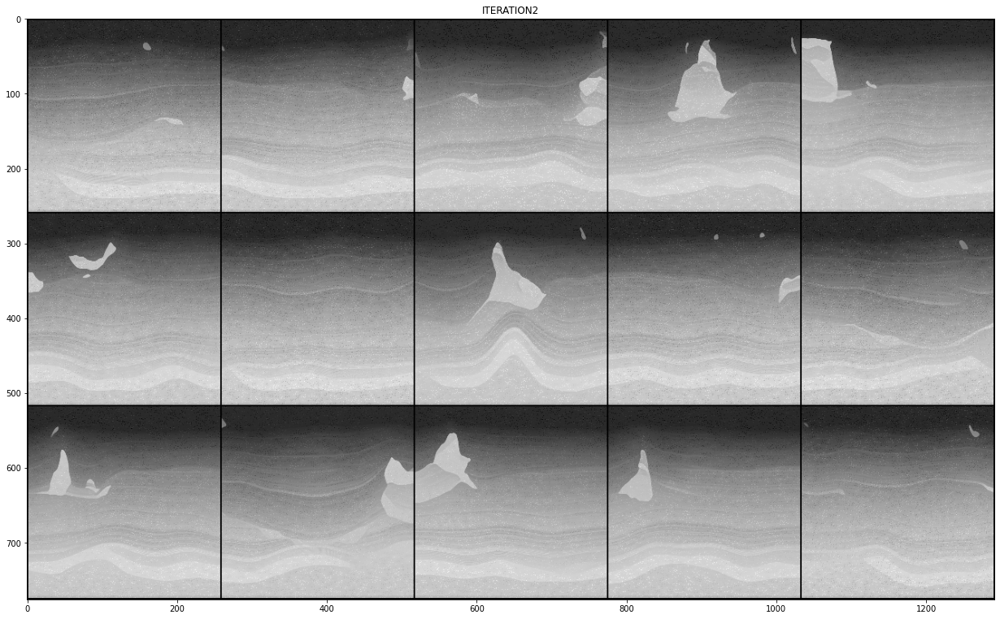

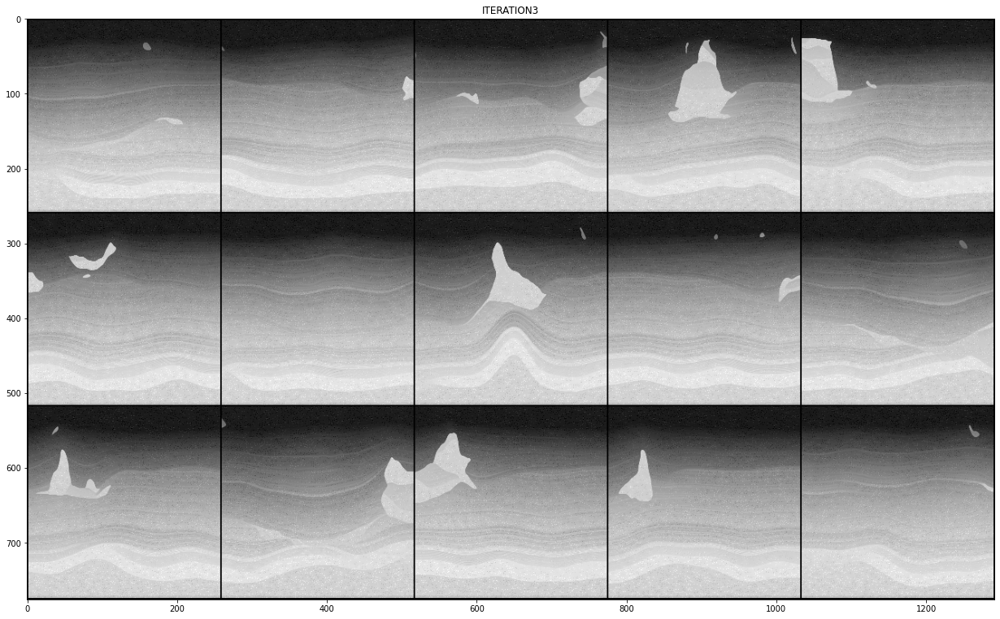

...

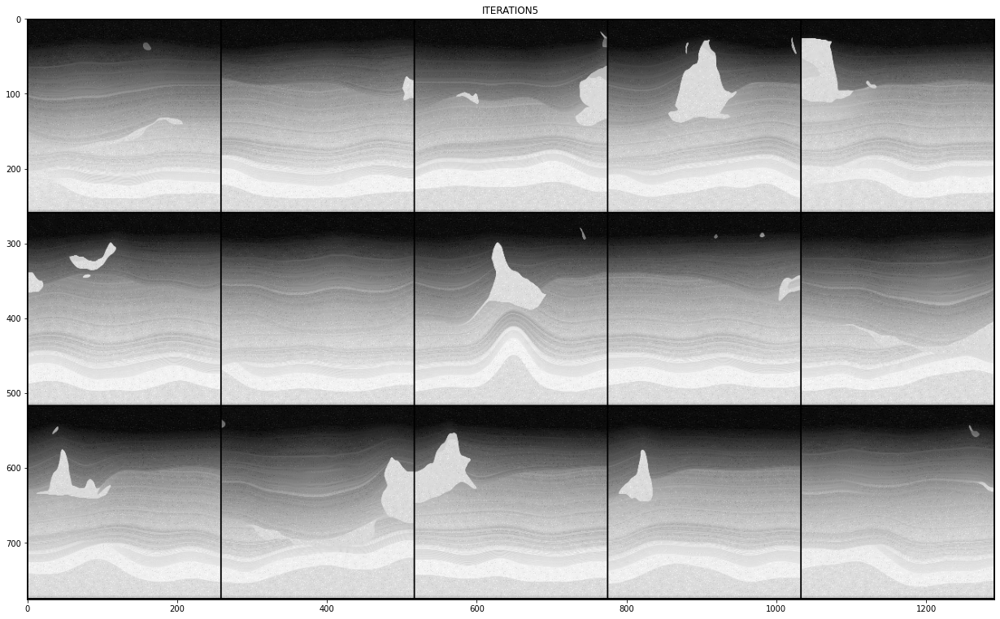

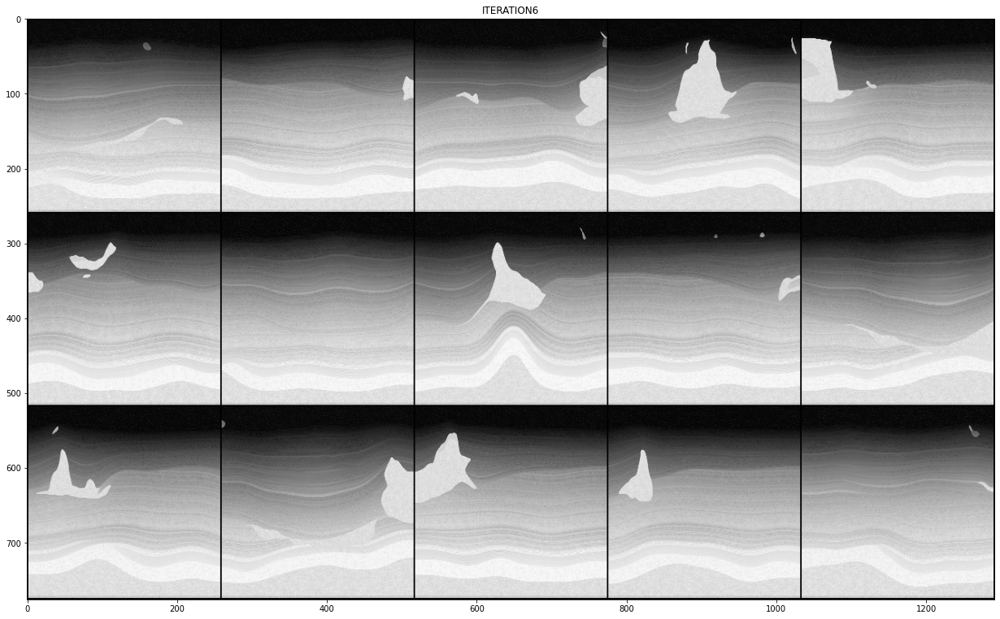

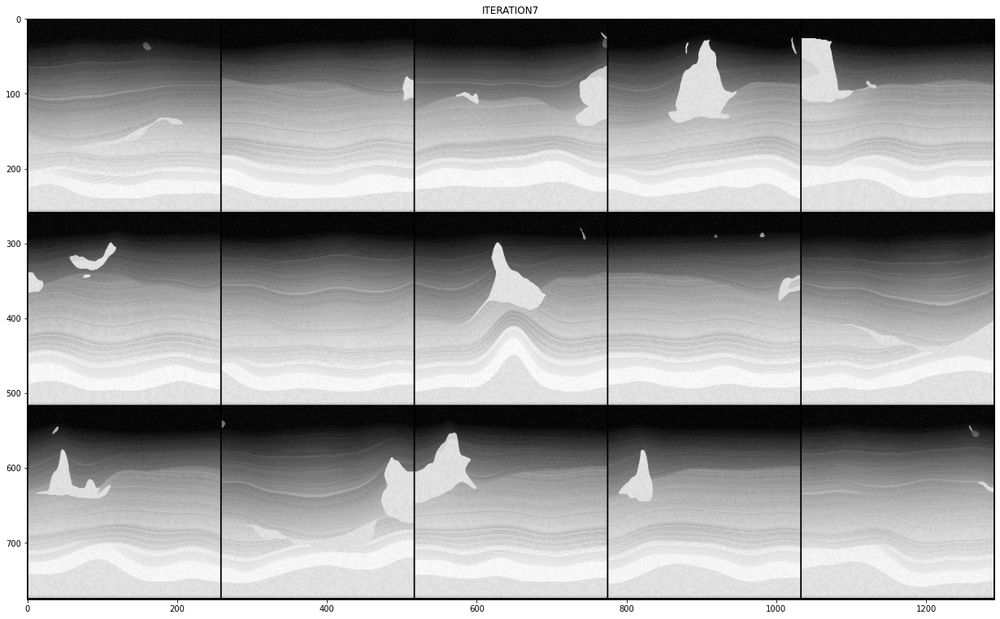

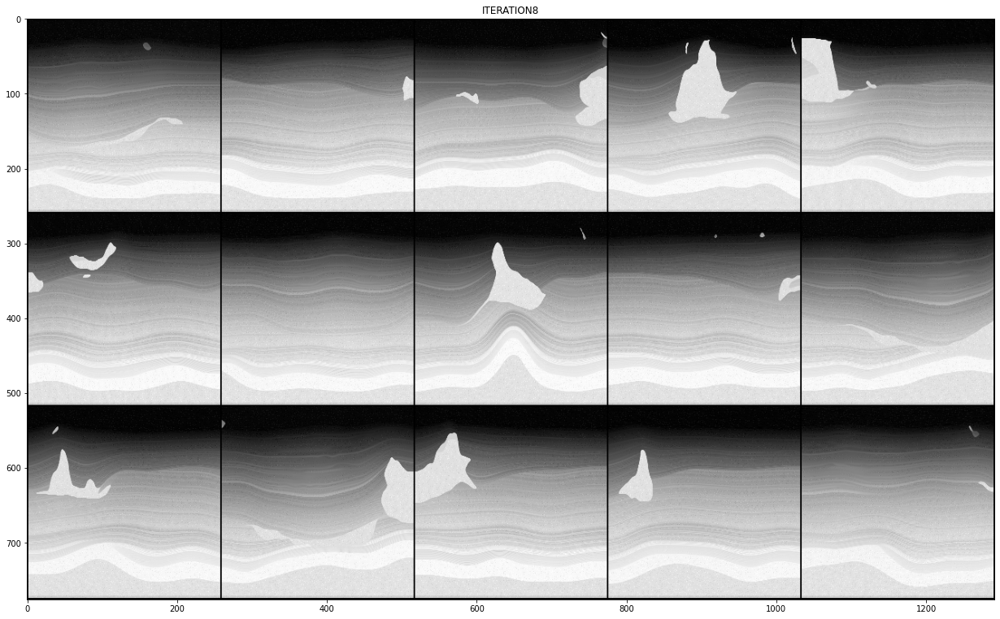

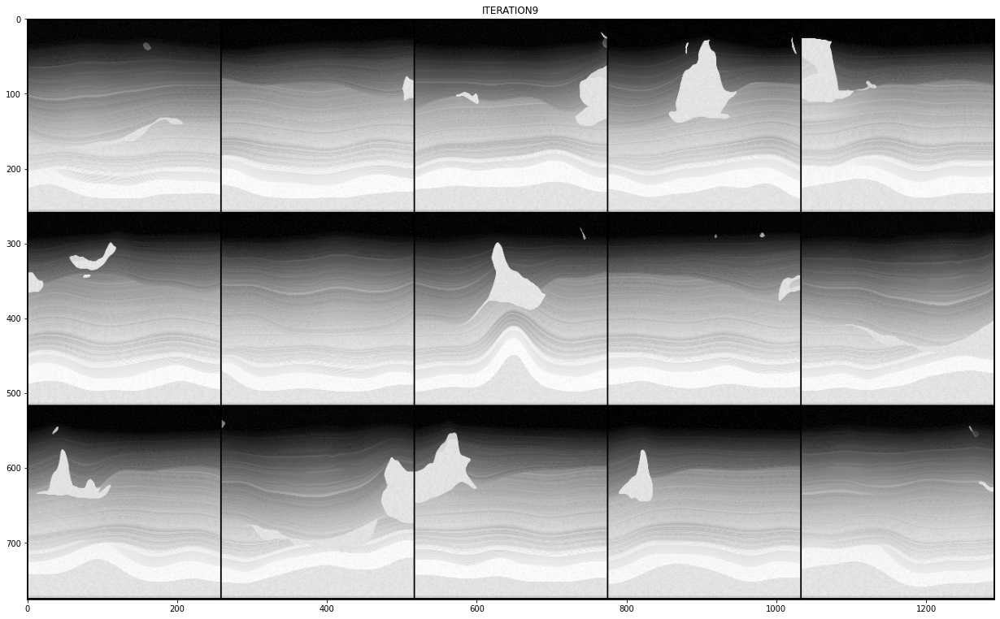

In [15]:
sample = x0.cpu()

sample = torch.clamp(sample, 0.0, 1.0)

grid_img = torchvision.utils.make_grid(sample, nrow=5)

dpi = matplotlib.rcParams['figure.dpi']

height = width = 6*256
figsize = width / float(dpi), height / float(dpi)

plt.figure(figsize=figsize)
plt.title("INITIALISATION")
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

for i in range(len(all_samples)//10):
    sample = all_samples[i*10].view(all_samples[i*10].shape[0], new_config.data.channels,
                                  new_config.data.image_size,
                                  new_config.data.image_size)

    sample = torch.clamp(sample, 0.0, 1.0)

    grid_img = torchvision.utils.make_grid(sample, nrow=5)

    dpi = matplotlib.rcParams['figure.dpi']

    height = width = 6*256
    figsize = width / float(dpi), height / float(dpi)

    plt.figure(figsize=figsize)
    plt.title("ITERATION" + str(i))
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.show()